# 55 · Information loss vs. clip duration (experiment-26)

Experiment 26 vibrates the empty metal box with the same chirp (50–1000 Hz) rendered at 10 different
durations (0.05–30 sec, one duration per sample, samples `000000`–`000009`) and recovers audio from
the captured vibrations. Goal: quantify how much information is lost as the clip gets shorter.

For every sample we:
1. run the recovery pipeline (`process_vibrations_2`) on the raw vibration capture to get `recovered_audio`
2. zero-pad both the original and recovered audio to a common frequency resolution and overlay all FFTs
3. let you listen to original vs. recovered audio for any sample
4. compute cosine similarity between original/recovered FFT magnitude spectra (in the box's 50–1000 Hz band)

## 1. Setup

In [1]:
import sys
from pathlib import Path

def _find_repo_root(marker='pyproject.toml'):
    # repo layout/paths change across machines and over time -- walk up from cwd (usually
    # notebooks/) instead of hardcoding an absolute path.
    for candidate in [Path.cwd().resolve(), *Path.cwd().resolve().parents]:
        if (candidate / marker).exists():
            return candidate
    raise RuntimeError(f"Could not find repo root (no {marker} found above {Path.cwd()})")

REPO_ROOT = _find_repo_root()
SRC_DIR = REPO_ROOT / 'src'
for p in (REPO_ROOT, SRC_DIR):
    if str(p) not in sys.path:
        sys.path.insert(0, str(p))

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from IPython.display import Audio, display
from tqdm import tqdm

from utils.io_utils import load
from data.vibrate import process_vibrations_2, get_clean_shifts

In [2]:
# ==== Parameters ====
SAMPLES_DIR = Path(r'D:\eturok\experiment-26\samples')
# SAMPLE_IDS = [f'{i:06d}' for i in range(10)]   # 000000 .. 000009
SAMPLE_IDS = [f'{i:06d}' for i in range(10, 20)]   # 000000 .. 000009


RECOVERY_LASER = 50   # matches DEFAULT_RECOVERY_LASER_IDX in data.vibrate
RECOVERY_XY = 0        # x-channel

MIN_FREQ, MAX_FREQ = 50, 1000   # the box's passband -- everything outside this is filtered out upstream

print(SAMPLE_IDS)

['000010', '000011', '000012', '000013', '000014', '000015', '000016', '000017', '000018', '000019']


## 2. Recover audio for every sample

Each sample's `vibration/00_raw_vibrations.npy` hasn't been processed yet (no `recovered_audio.wav` on
disk for experiment-26), so we run the recovery pipeline here. `process_vibrations_2` is the fast,
disk-free path (`do_save=False`) used elsewhere in `src/record.ipynb` for previewing a sample; we pass
`pclk_mode='batched_optimized'`, `pclk_batch_size=256` to run pclk on the local GPU.

In [3]:
def load_metadata(path):
    return {k: v for d in load(path) for k, v in d.items()}

def load_sample(sample_id: str) -> dict:
    sample_dir = SAMPLES_DIR / sample_id

    # original audio: sample_dir/audio.wav symlinks into the chirp variant used for this sample
    orig_samples, orig_fs = load(sample_dir / 'audio.wav')
    chirp_meta = load_metadata((sample_dir / 'audio.wav').resolve().parent / 'metadata.jsonl')
    duration = chirp_meta['T_sec']

    # recover audio from the raw vibration capture
    raw_vibrations = load(sample_dir / 'vibration/00_raw_vibrations.npy')
    vib = process_vibrations_2(sample_dir, raw_vibrations, pclk_mode='batched_optimized', pclk_batch_size=256,
                                do_save=False, verbose=0, cleanup_raw_vibrations=None, spectrogram_video=False,
                                laser_idx=RECOVERY_LASER, xy_idx=RECOVERY_XY)

    return dict(sample_id=sample_id, duration=duration,
                orig_samples=orig_samples, orig_fs=orig_fs,
                rec_samples=vib['recovered_audio'], rec_fs=vib['audio_sample_rate'])

samples = [load_sample(sid) for sid in tqdm(SAMPLE_IDS, desc='recovering audio')]
samples.sort(key=lambda s: s['duration'])
[(s['sample_id'], s['duration']) for s in samples]


recovering audio:   0%|          | 0/10 [00:00<?, ?it/s]

C:\Users\eitanturok\good-vibrations\.venv\Lib\site-packages\cupy\_environment.py:215: UserWarning: CUDA path could not be detected. Set CUDA_PATH environment variable if CuPy fails to load.
  warnings.warn(



recovering audio:  10%|█         | 1/10 [00:11<01:40, 11.17s/it]


recovering audio:  20%|██        | 2/10 [00:16<01:02,  7.82s/it]


recovering audio:  30%|███       | 3/10 [00:19<00:37,  5.42s/it]


recovering audio:  40%|████      | 4/10 [00:21<00:24,  4.00s/it]


recovering audio:  50%|█████     | 5/10 [00:22<00:15,  3.00s/it]


recovering audio:  60%|██████    | 6/10 [00:23<00:09,  2.29s/it]


recovering audio:  70%|███████   | 7/10 [00:23<00:05,  1.73s/it]


recovering audio:  80%|████████  | 8/10 [00:23<00:02,  1.26s/it]


recovering audio:  90%|█████████ | 9/10 [00:24<00:00,  1.03it/s]


recovering audio: 100%|██████████| 10/10 [00:24<00:00,  1.29it/s]


recovering audio: 100%|██████████| 10/10 [00:24<00:00,  2.47s/it]

[('000019', 0.05),
 ('000018', 0.1),
 ('000017', 0.25),
 ('000016', 0.5),
 ('000015', 1),
 ('000014', 2),
 ('000013', 3),
 ('000012', 5),
 ('000011', 10),
 ('000010', 30)]

## 3. Zero-pad to a common frequency resolution

Every sample has a different clip duration, and original (44.1 kHz) and recovered (22.05 kHz) audio use
different sample rates -- so their raw FFTs live on different frequency grids of different lengths and
can't be compared directly. Zero-padding each signal to the same target duration before the FFT fixes
this: frequency resolution is `df = fs / N`, and choosing `N = round(target_duration * fs)` for each
signal's own `fs` makes `df = 1 / target_duration` for *every* signal, independent of sample rate. That
puts every FFT on the same frequency grid so the magnitude vectors are directly comparable.

We pad (never truncate) up to the longest signal in the whole dataset -- the 30 sec original clip -- so
every FFT gets the finest, shared frequency resolution.

In [4]:
def zero_pad_fft(sig: np.ndarray, fs: int, target_duration: float):
    """Zero-pad sig to `target_duration` seconds (at its own fs) and return (freqs, magnitude)."""
    sig = np.asarray(sig, dtype=np.float64)
    n = max(len(sig), int(round(target_duration * fs)))
    padded = np.zeros(n, dtype=np.float64)
    padded[:len(sig)] = sig
    freqs = np.fft.rfftfreq(n, d=1.0 / fs)
    mag = np.abs(np.fft.rfft(padded))
    return freqs, mag

target_duration = max(len(s['orig_samples']) / s['orig_fs'] for s in samples)
target_duration = max(target_duration, max(len(s['rec_samples']) / s['rec_fs'] for s in samples))
print(f'{target_duration=:.3f}s -> shared frequency resolution df = {1/target_duration:.4f} Hz')

for s in samples:
    s['orig_freqs'], s['orig_mag'] = zero_pad_fft(s['orig_samples'], s['orig_fs'], target_duration)
    s['rec_freqs'], s['rec_mag'] = zero_pad_fft(s['rec_samples'], s['rec_fs'], target_duration)

target_duration=30.380s -> shared frequency resolution df = 0.0329 Hz


## 4. Recovered FFT, overlaid

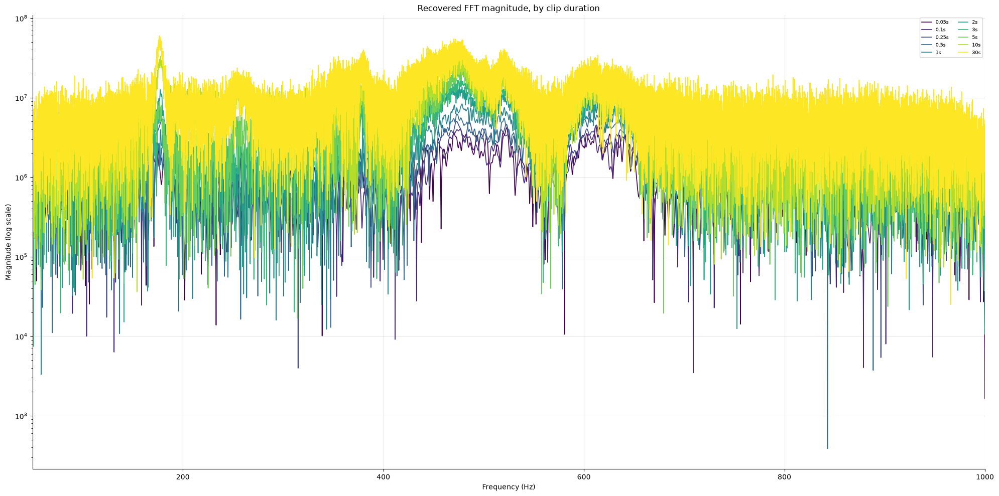

In [5]:
fig, ax = plt.subplots(figsize=(20, 10), dpi=100)
colors = cm.viridis(np.linspace(0, 1, len(samples)))

for s, color in zip(samples, colors):
    band_r = (s['rec_freqs'] >= MIN_FREQ) & (s['rec_freqs'] <= MAX_FREQ)
    ax.plot(s['rec_freqs'][band_r], s['rec_mag'][band_r], color=color, linestyle='-', linewidth=1.2,
            label=f"{s['duration']}s")

ax.set(xlabel='Frequency (Hz)', ylabel='Magnitude (log scale)', title='Recovered FFT magnitude, by clip duration')
ax.set_yscale('log')
ax.set_xlim(MIN_FREQ, MAX_FREQ)
ax.legend(fontsize=7, ncol=2, loc='upper right')
ax.grid(True, alpha=0.3)
for spine in ('top', 'right'): ax.spines[spine].set_visible(False)
fig.tight_layout()
plt.show()

In [65]:
samples[0].keys()

dict_keys(['sample_id', 'duration', 'orig_samples', 'orig_fs', 'rec_samples', 'rec_fs', 'orig_freqs', 'orig_mag', 'rec_freqs', 'rec_mag', 'rec_norm_freqs', 'rec_norm_mag', 'rec_psd_freqs', 'rec_psd', 'rec_norm_psd_freqs', 'rec_norm_psd'])

## 5. Normalized (zero-mean, unit-std) FFT, overlaid

Different clips can differ in overall loudness/gain, which shows up as a pure vertical scale difference
in the FFT and can make spectra look more different than they really are. Normalizing each signal before
the FFT removes that per-capture gain so the plots below compare *shape*, not scale.

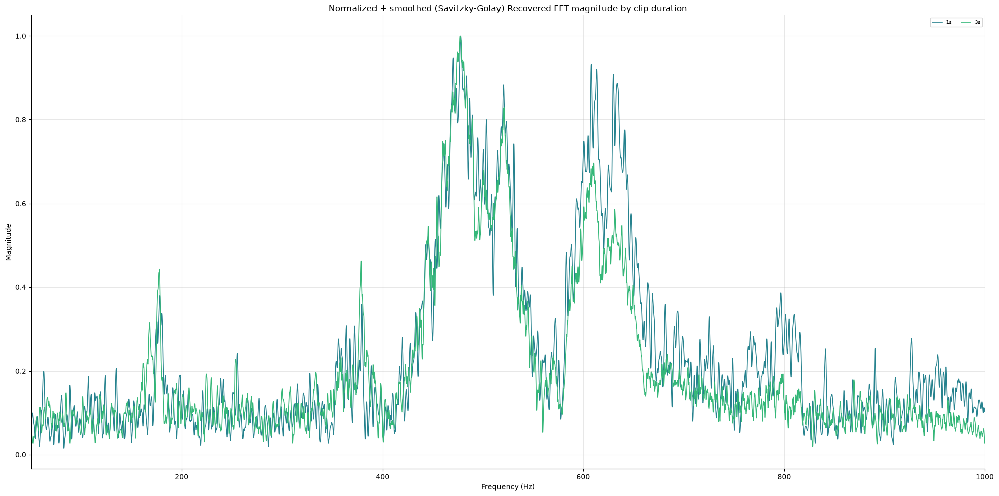

In [68]:
from scipy.signal import savgol_filter

def zscore(sig: np.ndarray) -> np.ndarray:
    sig = np.asarray(sig, dtype=np.float64)
    sig = sig - sig.mean()
    std = sig.std()
    return sig / std if std > 0 else sig

def std_norm(sig: np.ndarray): return sig / sig.std()

def max_norm(sig: np.ndarray): return sig / sig.max()

def hann_window(sig: np.ndarray) -> np.ndarray:
    sig = np.asarray(sig, dtype=np.float64)
    return sig * np.hanning(len(sig))

def smooth_mag(mag: np.ndarray, window: int = 101, polyorder: int = 3) -> np.ndarray:
    """Savitzky-Golay smoothing: fits a local polynomial instead of box-averaging, so it
    knocks down single-bin estimator noise while preserving the height/shape of real,
    wider resonance peaks better than a plain moving average would."""
    window = min(window, len(mag) - (1 - len(mag) % 2))  # must be odd and <= len(mag)
    return savgol_filter(mag, window_length=window, polyorder=polyorder)

for s in samples:
    s['rec_norm_freqs'], s['rec_norm_mag'] = zero_pad_fft(s['rec_samples'], s['rec_fs'], target_duration)
    s['rec_norm_mag'] = max_norm(smooth_mag(s['rec_norm_mag']))

# for s in samples:
#     windowed = hann_window(s['rec_samples'])
#     s['rec_norm_freqs'], s['rec_norm_mag'] = zero_pad_fft(std_norm(windowed), s['rec_fs'], target_duration)

fig, ax = plt.subplots(figsize=(20, 10), dpi=100)
for s, color in zip(samples, colors):
    if s['duration'] not in [1, 3]: continue
    band_r = (s['rec_norm_freqs'] >= MIN_FREQ) & (s['rec_norm_freqs'] <= MAX_FREQ)
    ax.plot(s['rec_norm_freqs'][band_r], s['rec_norm_mag'][band_r], color=color, linestyle='-', linewidth=1.2,
            label=f"{s['duration']}s")

ax.set(xlabel='Frequency (Hz)', ylabel='Magnitude', title='Normalized + smoothed (Savitzky-Golay) Recovered FFT magnitude by clip duration')
ax.set_xlim(MIN_FREQ, MAX_FREQ)
ax.legend(fontsize=7, ncol=2, loc='upper right')
ax.grid(True, alpha=0.3)
for spine in ('top', 'right'): ax.spines[spine].set_visible(False)
fig.tight_layout()
plt.show()

In [67]:
for s in samples:
    print(s['duration'])

0.05
0.1
0.25
0.5
1
2
3
5
10
30


## 6. Power spectral density (Welch), overlaid

Same "equal frequency resolution regardless of sample rate" trick as the FFT, applied to Welch's method:
fixing the segment length in seconds (`PSD_SEG_DURATION`) rather than in samples makes
`nperseg / fs = PSD_SEG_DURATION` for every signal, so `df = 1 / PSD_SEG_DURATION` is the same across
clip durations -- Welch averages out estimator noise that the raw FFT above doesn't.

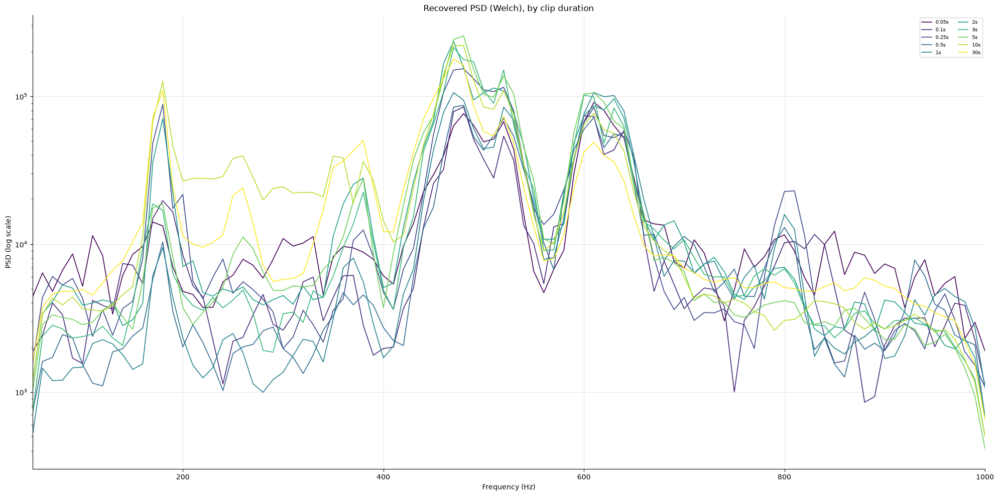

In [7]:
from scipy.signal import welch

PSD_SEG_DURATION = 0.1  # seconds

def compute_psd(sig: np.ndarray, fs: int, seg_duration: float = PSD_SEG_DURATION):
    sig = np.asarray(sig, dtype=np.float64)
    nperseg = min(len(sig), int(round(seg_duration * fs)))
    freqs, psd = welch(sig, fs=fs, nperseg=nperseg, noverlap=nperseg // 2)
    return freqs, psd

for s in samples:
    s['rec_psd_freqs'], s['rec_psd'] = compute_psd(s['rec_samples'], s['rec_fs'])

fig, ax = plt.subplots(figsize=(20, 10), dpi=100)
for s, color in zip(samples, colors):
    band_r = (s['rec_psd_freqs'] >= MIN_FREQ) & (s['rec_psd_freqs'] <= MAX_FREQ)
    ax.plot(s['rec_psd_freqs'][band_r], s['rec_psd'][band_r], color=color, linestyle='-', linewidth=1.2,
            label=f"{s['duration']}s")

ax.set(xlabel='Frequency (Hz)', ylabel='PSD (log scale)', title='Recovered PSD (Welch), by clip duration')
ax.set_yscale('log')
ax.set_xlim(MIN_FREQ, MAX_FREQ)
ax.legend(fontsize=7, ncol=2, loc='upper right')
ax.grid(True, alpha=0.3)
for spine in ('top', 'right'): ax.spines[spine].set_visible(False)
fig.tight_layout()
plt.show()

## 7. Normalized (zero-mean, unit-std) PSD, overlaid

Same z-scoring, applied before the Welch PSD instead of the raw FFT.

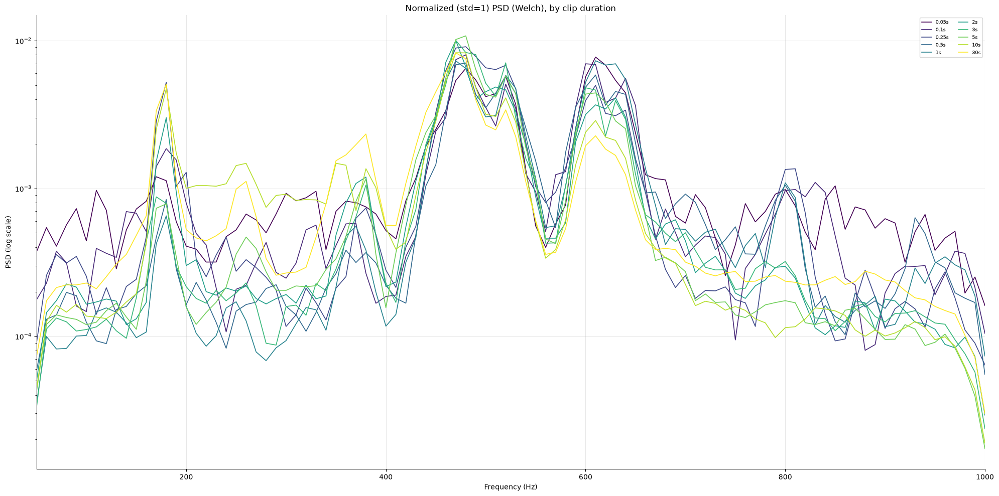

In [8]:
for s in samples:
    s['rec_norm_psd_freqs'], s['rec_norm_psd'] = compute_psd(zscore(s['rec_samples']), s['rec_fs'])

fig, ax = plt.subplots(figsize=(20, 10), dpi=100)
for s, color in zip(samples, colors):
    band_r = (s['rec_norm_psd_freqs'] >= MIN_FREQ) & (s['rec_norm_psd_freqs'] <= MAX_FREQ)
    ax.plot(s['rec_norm_psd_freqs'][band_r], s['rec_norm_psd'][band_r], color=color, linestyle='-', linewidth=1.2,
            label=f"{s['duration']}s")

ax.set(xlabel='Frequency (Hz)', ylabel='PSD (log scale)', title='Normalized (std=1) PSD (Welch), by clip duration')
ax.set_yscale('log')
ax.set_xlim(MIN_FREQ, MAX_FREQ)
ax.legend(fontsize=7, ncol=2, loc='upper right')
ax.grid(True, alpha=0.3)
for spine in ('top', 'right'): ax.spines[spine].set_visible(False)
fig.tight_layout()
plt.show()

## 8. Listen to original vs. recovered audio

Call `listen(sample_id)` for any of `000000`..`000009`, or run the loop below to hear all 10 back to back.

In [9]:
def listen(sample_id: str):
    s = next(s for s in samples if s['sample_id'] == sample_id)
    print(f"sample {sample_id} -- duration {s['duration']}s")
    print('Original:')
    display(Audio(s['orig_samples'], rate=s['orig_fs']))
    print('Recovered:')
    display(Audio(s['rec_samples'], rate=s['rec_fs']))

listen(samples[0]['sample_id'])

sample 000019 -- duration 0.05s
Original:


Recovered:


In [10]:
for s in samples:
    listen(s['sample_id'])

sample 000019 -- duration 0.05s
Original:


Recovered:


sample 000018 -- duration 0.1s
Original:


Recovered:


sample 000017 -- duration 0.25s
Original:


Recovered:


sample 000016 -- duration 0.5s
Original:


Recovered:


sample 000015 -- duration 1s
Original:


Recovered:


sample 000014 -- duration 2s
Original:


Recovered:


sample 000013 -- duration 3s
Original:


Recovered:


sample 000012 -- duration 5s
Original:


Recovered:


sample 000011 -- duration 10s
Original:


Recovered:


sample 000010 -- duration 30s
Original:


Recovered:


## 9. Cosine similarity between FFT magnitudes

Cosine similarity between the (zero-padded) original and recovered magnitude spectra, restricted to the
box's 50–1000 Hz passband -- 1.0 means the recovered spectrum's shape perfectly matches the original's
over that band, 0.0 means no relationship.

In [11]:
def cosine_similarity(a: np.ndarray, b: np.ndarray) -> float:
    n = min(len(a), len(b))
    a, b = a[:n], b[:n]
    return float(np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b) + 1e-12))

def band_mag(freqs, mag, lo=MIN_FREQ, hi=MAX_FREQ):
    mask = (freqs >= lo) & (freqs <= hi)
    return mag[mask]

for s in samples:
    s['cos_sim'] = cosine_similarity(band_mag(s['orig_freqs'], s['orig_mag']), band_mag(s['rec_freqs'], s['rec_mag']))

print(f"{'duration (s)':>12} | {'cosine similarity':>18}")
for s in samples:
    print(f"{s['duration']:>12} | {s['cos_sim']:>18.4f}")

duration (s) |  cosine similarity
        0.05 |             0.7464
         0.1 |             0.6810
        0.25 |             0.6712
         0.5 |             0.6211
           1 |             0.6032
           2 |             0.6370
           3 |             0.6084
           5 |             0.6141
          10 |             0.7021
          30 |             0.6973


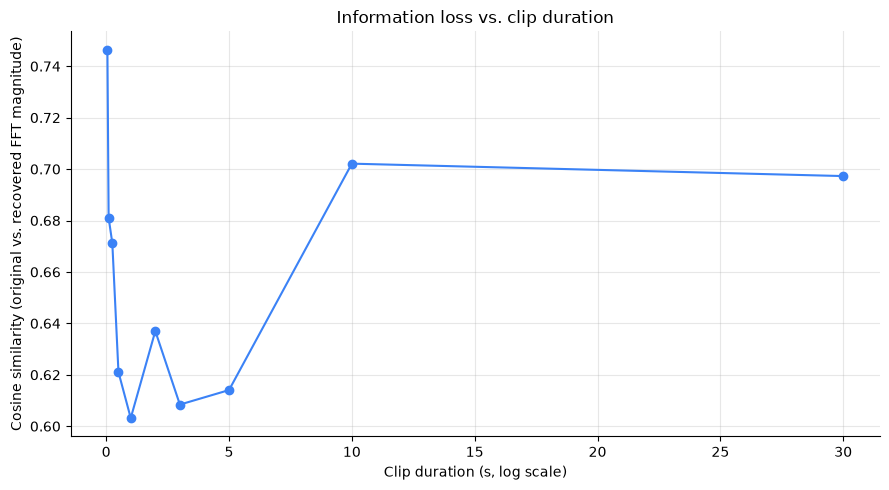

In [12]:
fig, ax = plt.subplots(figsize=(9, 5), dpi=100)
durations = [s['duration'] for s in samples]
cos_sims = [s['cos_sim'] for s in samples]
ax.plot(durations, cos_sims, marker='o', color='#3b82f6')
ax.set(xlabel='Clip duration (s, log scale)', ylabel='Cosine similarity (original vs. recovered FFT magnitude)',
       title='Information loss vs. clip duration')
# ax.set_xscale('log')
ax.grid(True, alpha=0.3)
for spine in ('top', 'right'): ax.spines[spine].set_visible(False)
fig.tight_layout()
plt.show()

## 10. Align FFT resolution to the trained model (`src/model/dataset.py`)

Your advisor's point: `process_vibration` (in `src/model/dataset.py`) expects every sample's FFT to land
on the **exact same frequency grid** it was trained on, because `freqs` is a fixed sidecar
(`freqs.npy`) shared across the whole MDS dataset, not something recomputed per sample. Frequency
resolution is `df = fps / n_samples`, so two captures only share a grid if they have the same `fps`
*and* the same number of raw time samples `n_samples` going into the FFT.

The recovery pipeline's `fps` is fixed at 2500 regardless of clip duration, but `n_samples = duration *
fps` is not -- our experiment-26 samples range from 125 to 76,500 time samples (0.05s-30s), while the
trained model (experiment-25) used fixed 3.1s captures -> `n_samples_train = 7750`. So the fix is exactly
what your advisor said, applied to the **raw shift signal, before the FFT** (not to the audio, and not
to the already-cropped FFT -- padding/resampling *after* cropping to [50,1000] Hz would not change the
number of bins):

- shorter than training (`T < n_samples_train`): zero-pad the time signal up to `n_samples_train`
- longer than training (`T > n_samples_train`): resample the time signal down to `n_samples_train`

Either way, the result has exactly `n_samples_train` time samples, so its `rfft` lands on precisely the
training's frequency grid -- confirmed below by checking it against experiment-25's actual `freqs.npy`.

In [13]:
from scipy.signal import resample as scipy_resample
from data.pclk import compute_shifts_for_all_rois_batched_optimized
from data.vibrate import get_clean_shifts, get_fft_shifts

# ==== training resolution, read from the actual trained dataset (not assumed) ====
FREQS_TRAIN = np.load(r'D:\eturok\experiment-25\mds\freqs.npy')
_train_fft_meta = load(Path(r'D:\eturok\experiment-25\samples\000000\vibration\03_fft.npz'))
N_SAMPLES_TRAIN = int(_train_fft_meta['n_samples'])   # 7750 = 3.1s capture @ 2500 fps
FPS_TRAIN = 2500

print(f'{FREQS_TRAIN.shape=}, training df = {FREQS_TRAIN[1] - FREQS_TRAIN[0]:.4f} Hz, {N_SAMPLES_TRAIN=}')

FREQS_TRAIN.shape=(2946,), training df = 0.3226 Hz, N_SAMPLES_TRAIN=7750


In [14]:
def compute_clean_shifts(sample_dir: Path, laser_idx: int, pclk_batch_size: int = 256):
    """Same pclk -> clean_shifts steps process_vibrations_2 runs internally, but stopping
    before the FFT (and returning the pre-cleaning raw_shifts too) so we can align the time
    axis first and inspect what get_clean_shifts's bandpass + Hann window actually does."""
    metadata = load_metadata(sample_dir / 'metadata.jsonl')
    fps, rois = int(metadata['fps']), metadata['roi']
    raw_vibrations = load(sample_dir / 'vibration/00_raw_vibrations.npy')
    x, y, w, h = rois[laser_idx]
    crop = np.ascontiguousarray(raw_vibrations[:, y:y + h, x:x + w])[None]  # (1, T, h, w)
    raw_shifts = compute_shifts_for_all_rois_batched_optimized(crop, pclk_batch_size, progress=False)  # (1, T, 2)
    clean_shifts = get_clean_shifts(raw_shifts[None], fps, MIN_FREQ, MAX_FREQ)  # (1, 1, T, 2) -- bandpass + Hann, see below
    return raw_shifts, clean_shifts, fps


def align_time_samples(shifts: np.ndarray, n_target: int) -> np.ndarray:
    """shifts: (B, L, T, C). Zero-pad if T < n_target, resample if T > n_target -- either way
    the output has exactly n_target time samples, so its rfft matches the training's df."""
    T = shifts.shape[2]
    if T == n_target:
        return shifts
    if T < n_target:
        pad_width = [(0, 0)] * shifts.ndim
        pad_width[2] = (0, n_target - T)
        return np.pad(shifts, pad_width)
    return scipy_resample(shifts, n_target, axis=2)


for s in samples:
    raw_shifts, clean_shifts, fps = compute_clean_shifts(SAMPLES_DIR / s['sample_id'], laser_idx=RECOVERY_LASER)
    assert fps == FPS_TRAIN, f"{s['sample_id']}: capture fps {fps} != training fps {FPS_TRAIN}"
    s['raw_shifts'], s['clean_shifts'] = raw_shifts, clean_shifts  # kept for the before/after plot below
    aligned_shifts = align_time_samples(clean_shifts, N_SAMPLES_TRAIN)
    aligned_fft, aligned_freqs, _ = get_fft_shifts(aligned_shifts, fps, MIN_FREQ, MAX_FREQ)
    s['aligned_fft'], s['aligned_freqs'] = aligned_fft, aligned_freqs

### Cleaning the shifts: bandpass + Hann window

The "cleaning" step is `get_clean_shifts` (`src/data/vibrate.py`), already called inside
`compute_clean_shifts` above for every sample -- it's not something you need to add, it already ran.
It does two things to the raw pclk shift signal:

1. **Butterworth bandpass filter** to `[MIN_FREQ, MAX_FREQ]` = [50, 1000] Hz (`scipy.signal.sosfiltfilt`,
   zero-phase) -- removes everything outside the box's excited band (DC drift, camera-vibration noise
   above 1 kHz, etc.).
2. **Hann window** (`np.hanning`) multiplied over the full time axis -- tapers the signal smoothly to
   zero at both ends so the FFT doesn't see the sharp on/off edges of a rectangular window as spurious
   high-frequency content (spectral leakage).

The plot below shows both steps on the longest clip (easiest to see the taper and the filtering).

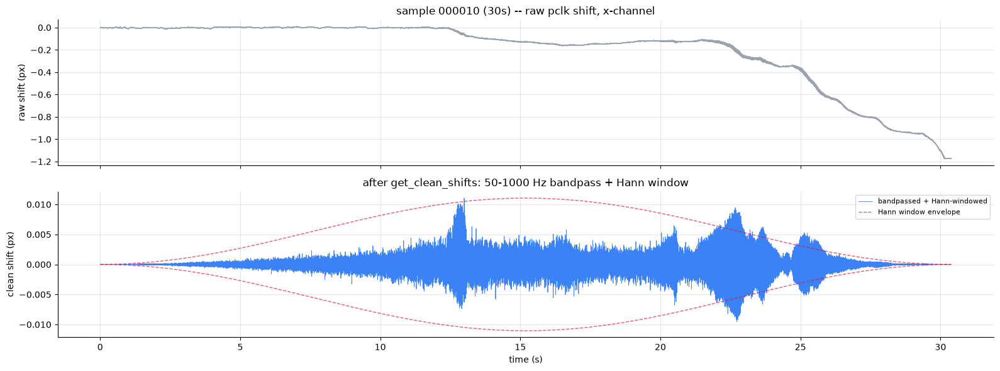

In [15]:
demo = samples[-1]  # longest clip -- easiest to see the Hann taper and bandpass filtering
t = np.arange(demo['raw_shifts'].shape[1]) / FPS_TRAIN
raw_x = demo['raw_shifts'][0, :, 0]          # (T,) raw pclk shift, x-channel
clean_x = demo['clean_shifts'][0, 0, :, 0]   # (T,) bandpassed + Hann-windowed, x-channel
hann_envelope = np.hanning(len(t)) * np.max(np.abs(clean_x))

fig, axes = plt.subplots(2, 1, figsize=(16, 6), sharex=True, dpi=100)
axes[0].plot(t, raw_x, color='#9ca3af', linewidth=0.6)
axes[0].set(ylabel='raw shift (px)', title=f"sample {demo['sample_id']} ({demo['duration']}s) -- raw pclk shift, x-channel")

axes[1].plot(t, clean_x, color='#3b82f6', linewidth=0.6, label='bandpassed + Hann-windowed')
axes[1].plot(t, hann_envelope, color='crimson', linewidth=1, linestyle='--', alpha=0.7, label='Hann window envelope')
axes[1].plot(t, -hann_envelope, color='crimson', linewidth=1, linestyle='--', alpha=0.7)
axes[1].set(xlabel='time (s)', ylabel='clean shift (px)', title='after get_clean_shifts: 50-1000 Hz bandpass + Hann window')
axes[1].legend(fontsize=8, loc='upper right')

for ax in axes:
    ax.grid(True, alpha=0.3)
    for spine in ('top', 'right'): ax.spines[spine].set_visible(False)
fig.tight_layout()
plt.show()

### Confirm alignment: same shape, same frequency grid, for every sample

In [16]:
freq_lengths = {s['sample_id']: s['aligned_freqs'].shape[0] for s in samples}
print('aligned frequency-bin count per sample:', freq_lengths)
assert len(set(freq_lengths.values())) == 1, 'not all samples share the same aligned frequency-bin count!'

for s in samples:
    assert s['aligned_freqs'].shape == FREQS_TRAIN.shape and np.allclose(s['aligned_freqs'], FREQS_TRAIN), \
        f"{s['sample_id']}: aligned freq grid does not match the training grid"

print(f"All {len(samples)} samples (durations {sorted(s['duration'] for s in samples)}) now share "
      f"exactly {FREQS_TRAIN.shape[0]} frequency bins on the training's df = {FREQS_TRAIN[1]-FREQS_TRAIN[0]:.4f} Hz grid.")

aligned frequency-bin count per sample: {'000019': 2946, '000018': 2946, '000017': 2946, '000016': 2946, '000015': 2946, '000014': 2946, '000013': 2946, '000012': 2946, '000011': 2946, '000010': 2946}
All 10 samples (durations [0.05, 0.1, 0.25, 0.5, 1, 2, 3, 5, 10, 30]) now share exactly 2946 frequency bins on the training's df = 0.3226 Hz grid.


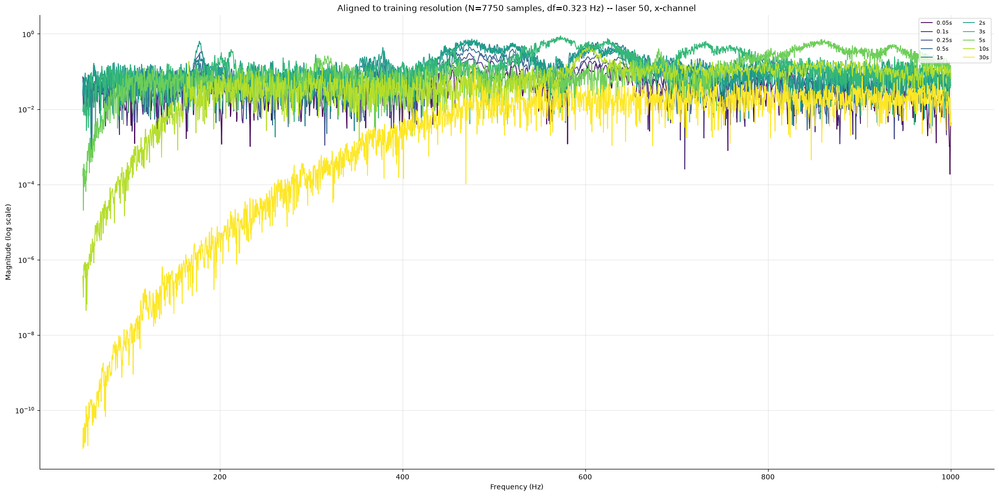

In [17]:
fig, ax = plt.subplots(figsize=(20, 10), dpi=100)
axis_label = 'x' if RECOVERY_XY == 0 else 'y'
for s, color in zip(samples, colors):
    mag = np.abs(s['aligned_fft'][0, 0, :, RECOVERY_XY])
    ax.plot(s['aligned_freqs'], mag, color=color, linewidth=1.2, label=f"{s['duration']}s")

ax.set(xlabel='Frequency (Hz)', ylabel='Magnitude (log scale)',
       title=f'Aligned to training resolution (N={N_SAMPLES_TRAIN} samples, df={FREQS_TRAIN[1]-FREQS_TRAIN[0]:.3f} Hz) '
             f'-- laser {RECOVERY_LASER}, {axis_label}-channel')
ax.set_yscale('log')
ax.legend(fontsize=8, ncol=2, loc='upper right')
ax.grid(True, alpha=0.3)
for spine in ('top', 'right'): ax.spines[spine].set_visible(False)
fig.tight_layout()
plt.show()

### Run it through `process_vibration` to confirm it's actually compatible

`signal_mode='magnitude'`, `normalize_mode='std'`, `patch_size=256` are `VibrationDataset`'s defaults --
swap in whatever your trained checkpoint actually used if different. `generator=None` skips the random
frequency-gain augmentation (the offline/eval path, per `process_vibration`'s docstring).

In [18]:
import torch
from model.dataset import process_vibration

SIGNAL_MODE, NORMALIZE_MODE, PATCH_SIZE = 'magnitude', 'std', 256
freqs_t = torch.from_numpy(FREQS_TRAIN)

for s in samples:
    fft_t = torch.from_numpy(s['aligned_fft'])  # (1, 1, F, 2) complex64
    model_input = process_vibration(fft_t, freqs_t, signal_mode=SIGNAL_MODE, normalize_mode=NORMALIZE_MODE, patch_size=PATCH_SIZE)
    s['model_input'] = model_input
    print(f"{s['sample_id']} ({s['duration']}s): fft {tuple(fft_t.shape)} -> process_vibration output {tuple(model_input.shape)}")

shapes = {tuple(s['model_input'].shape) for s in samples}
assert len(shapes) == 1, f'process_vibration produced different output shapes across samples: {shapes}'
print(f'\nEvery sample -> identical process_vibration output shape {shapes.pop()}, regardless of original clip duration.')

W0721 17:07:18.596000 8680 .venv\Lib\site-packages\torch\distributed\elastic\multiprocessing\redirects.py:29] NOTE: Redirects are currently not supported in Windows or MacOs.


000019 (0.05s): fft (1, 1, 2946, 2) -> process_vibration output (1, 1, 11, 256, 2)
000018 (0.1s): fft (1, 1, 2946, 2) -> process_vibration output (1, 1, 11, 256, 2)
000017 (0.25s): fft (1, 1, 2946, 2) -> process_vibration output (1, 1, 11, 256, 2)
000016 (0.5s): fft (1, 1, 2946, 2) -> process_vibration output (1, 1, 11, 256, 2)
000015 (1s): fft (1, 1, 2946, 2) -> process_vibration output (1, 1, 11, 256, 2)
000014 (2s): fft (1, 1, 2946, 2) -> process_vibration output (1, 1, 11, 256, 2)
000013 (3s): fft (1, 1, 2946, 2) -> process_vibration output (1, 1, 11, 256, 2)
000012 (5s): fft (1, 1, 2946, 2) -> process_vibration output (1, 1, 11, 256, 2)
000011 (10s): fft (1, 1, 2946, 2) -> process_vibration output (1, 1, 11, 256, 2)
000010 (30s): fft (1, 1, 2946, 2) -> process_vibration output (1, 1, 11, 256, 2)

Every sample -> identical process_vibration output shape (1, 1, 11, 256, 2), regardless of original clip duration.
